# SKIN CANCER DETECTION & CLASSIFICATION

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
from PIL import Image

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
np.random.seed(123)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import confusion_matrix
import itertools

import pandas as pd
import numpy as np
import keras
from keras import backend as K

import tensorflow
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

import os

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
import itertools
import shutil
import matplotlib.pyplot as plt

## DATA

In [3]:
# Reading files using file name from the csv and add then corresponding image in a pandas dataframe along with labels. 

skin_df = pd.read_csv('DATA/HAM10000_metadata.csv')

In [4]:
skin_df.head()  

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [5]:
skin_df.shape

(10015, 7)

Distrbuition of Classes

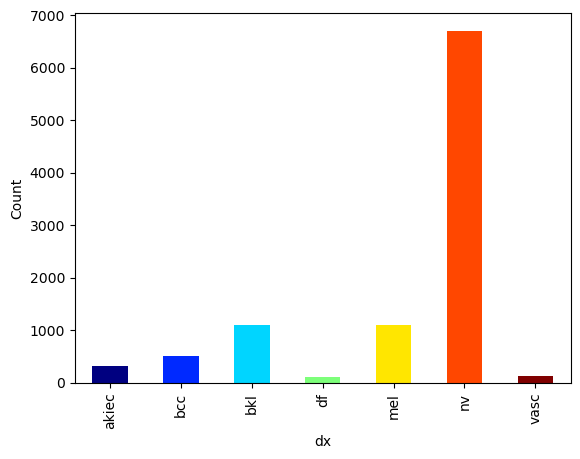

In [6]:
count = skin_df.dx.value_counts().sort_index()

unique_vals = count.index
colors = plt.cm.jet(np.linspace(0, 1, len(unique_vals)))

count.plot(kind='bar', color=colors)

plt.ylabel('Count')
plt.show()

# Cleaning the RAW Data 

Missing data checking and then filling the missing data values with the mean of their category, since the category is a float number.

In [8]:
def check_for_missing_data(df):
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values
    return summary

In [9]:
check_for_missing_data(skin_df)

,Name,dtypes,Missing
0,lesion_id,object,0
1,image_id,object,0
2,dx,object,0
3,dx_type,object,0
4,age,float64,57
5,sex,object,0
6,localization,object,0


In [10]:
skin_df['age'].fillna((skin_df['age'].mean()), inplace=True)

In [11]:
def convert_float_to_int(df, column_name):
    if df[column_name].dtype == 'float64':
        df[column_name] = df[column_name].astype(int)
    return df

In [12]:
skin_df = convert_float_to_int(skin_df,'age')
skin_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   lesion_id     10015 non-null  object
 1   image_id      10015 non-null  object
 2   dx            10015 non-null  object
 3   dx_type       10015 non-null  object
 4   age           10015 non-null  int32 
 5   sex           10015 non-null  object
 6   localization  10015 non-null  object
dtypes: int32(1), object(6)
memory usage: 508.7+ KB


Checking and removing the duplicates if there are any

In [13]:
def check_for_duplicate_rows(df):
    size = df.shape
    sum_duplicates = df.duplicated().sum()
    sum_null = df.isnull().sum()
    return print("Number of Samples:" ,size[0],"\nDuplicated Entries: " ,sum_duplicates,"\nNull Entries:","\n",sum_null)

In [14]:
check_for_duplicate_rows(skin_df)

Number of Samples: 10015 
Duplicated Entries:  0 
Null Entries: 
 lesion_id       0
image_id        0
dx              0
dx_type         0
age             0
sex             0
localization    0
dtype: int64


In [15]:
lesion_id_cnt = skin_df['lesion_id'].value_counts()
def check_duplicates_lesions(id):
    if lesion_id_cnt[id] > 1:
        return True
    else:
        return False

skin_df['dup_les'] = skin_df['lesion_id'].map(check_duplicates_lesions)

In [16]:
skin_df['dup_les'].value_counts()

dup_les
False    5514
True     4501
Name: count, dtype: int64

In [17]:
skin_df = skin_df[skin_df.dup_les == False]
skin_df.shape

(5514, 8)

# Loading the images 

In [18]:
import os
import glob
import pandas as pd
from PIL import Image
import numpy as np


# Define the base directory for your local images (if applicable)
base1_path = os.path.join('DATA', 'HAM10000_images_part_1')
base2_path = os.path.join('DATA', 'HAM10000_images_part_2')

# Initialize an empty list to store image paths
image_paths = []

# Create a dictionary that maps image_id to the image path for quick lookup
image_path_dict = {
    os.path.splitext(os.path.basename(x))[0]: x
    for x in glob.glob(os.path.join('DATA', '*', '*.jpg'))  # Adjust the path as needed
}

# Loop through your metadata and match the image paths
for index, row in skin_df.iterrows():
    image_id = row['image_id']
    class_name = row['dx']
    
    # Create paths for part 1 and part 2 of the dataset
    image_path_1 = os.path.join(base1_path, f'{image_id}.jpg')
    image_path_2 = os.path.join(base2_path, f'{image_id}.jpg')
    
    # Check if either part of the image exists in the local directory
    if os.path.exists(image_path_1):
        image_paths.append(image_path_1)
    elif os.path.exists(image_path_2):
        image_paths.append(image_path_2)
    else:
        print(f'Image {image_id} not found in either part 1 or part 2.')

# Add the image paths to the metadata dataframe
skin_df['image_path'] = image_paths

# If you want to load the images as well, you can use the following code
# Read images in original size
skin_df['image'] = skin_df['image_path'].map(lambda x: np.asarray(Image.open(x)) if x is not None else None)

# Now, skin_df will have a 'image_path' column with image paths and an 'image' column with image data.


In [19]:
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dup_les,image_path,image
10,HAM_0001396,ISIC_0025276,bkl,histo,55,female,trunk,False,DATA\HAM10000_images_part_1\ISIC_0025276.jpg,"[[[22, 13, 16], [22, 11, 15], [22, 11, 15], [2..."
15,HAM_0007207,ISIC_0031326,bkl,histo,65,male,back,False,DATA\HAM10000_images_part_2\ISIC_0031326.jpg,"[[[202, 160, 180], [198, 159, 178], [197, 160,..."
20,HAM_0006071,ISIC_0032343,bkl,histo,70,female,face,False,DATA\HAM10000_images_part_2\ISIC_0032343.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
33,HAM_0005612,ISIC_0024981,bkl,histo,80,male,scalp,False,DATA\HAM10000_images_part_1\ISIC_0024981.jpg,"[[[204, 209, 213], [205, 204, 209], [205, 203,..."
34,HAM_0005388,ISIC_0027815,bkl,histo,80,male,chest,False,DATA\HAM10000_images_part_1\ISIC_0027815.jpg,"[[[0, 0, 0], [0, 0, 0], [1, 1, 1], [6, 4, 7], ..."


In [20]:
skin_df.shape

(5514, 10)

# Data analysis and exploration

<Axes: ylabel='count'>

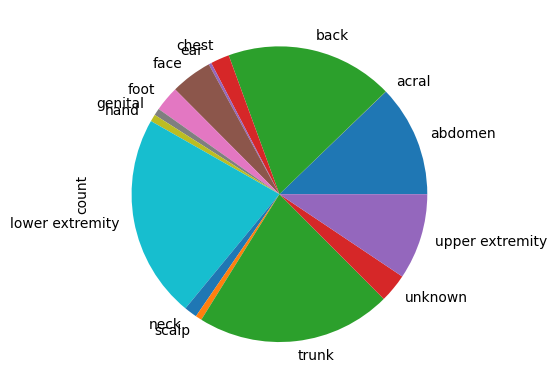

In [25]:
count.plot(kind='pie')

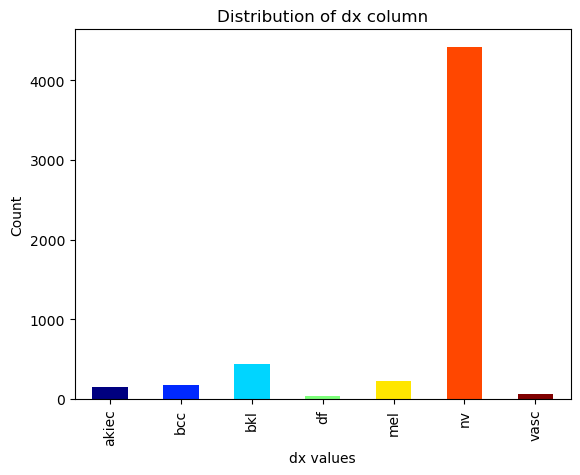

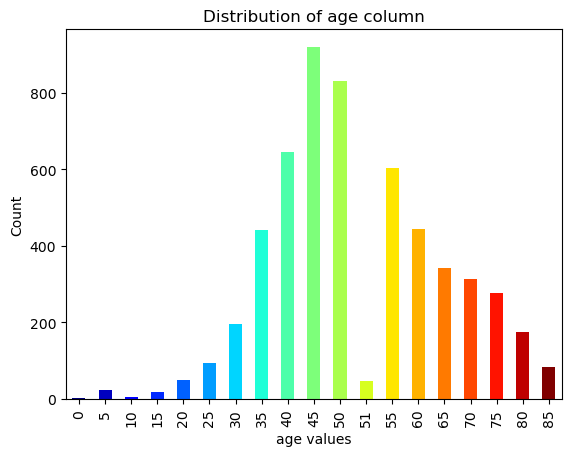

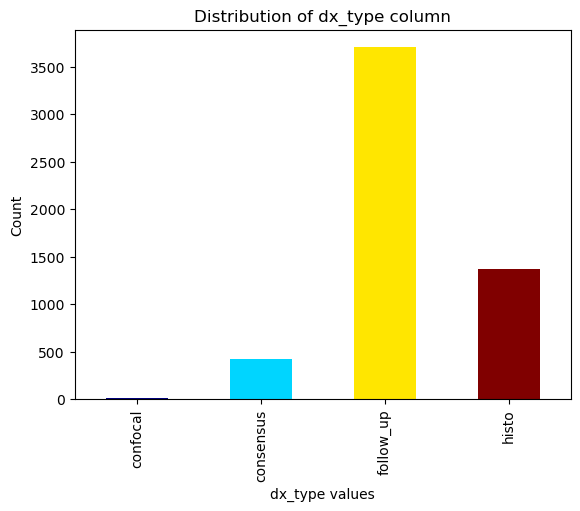

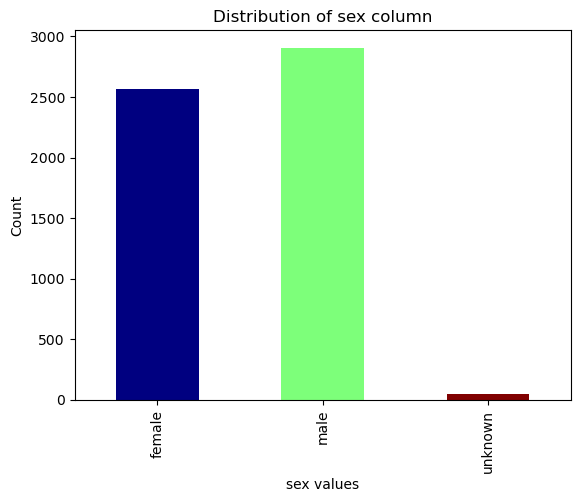

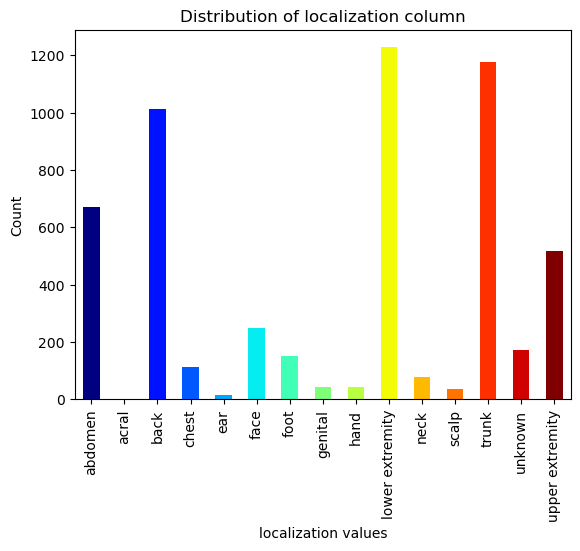

In [26]:
columns_exp = ['dx','age','dx_type', 'sex', 'localization']

for column in columns_exp:
  count = skin_df[column].value_counts().sort_index()

  unique_vals = count.index
  colors = plt.cm.jet(np.linspace(0, 1, len(unique_vals)))

  count.plot(kind='bar', color=colors)

  plt.xlabel(f'{column} values')
  plt.ylabel('Count')
  plt.title(f'Distribution of {column} column')
  plt.show()

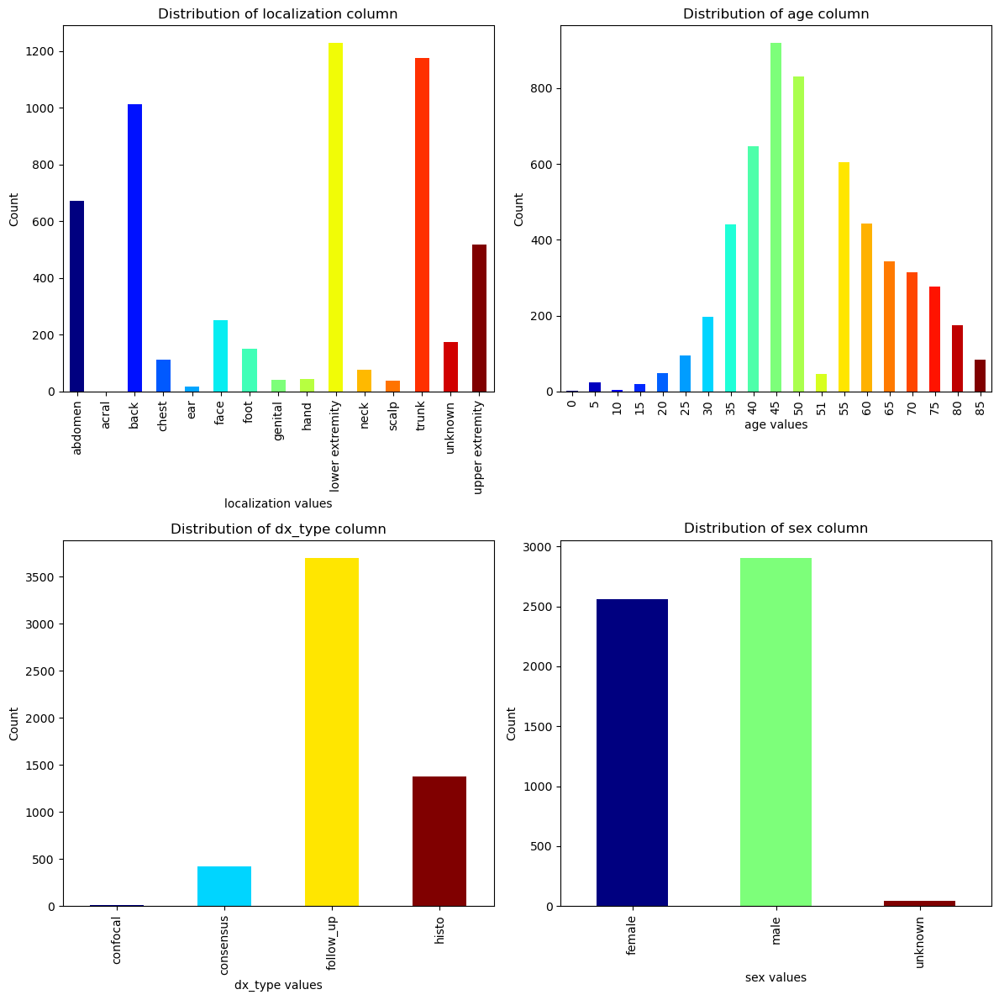

In [28]:
import matplotlib.pyplot as plt
import numpy as np

# Define the columns to plot (with 'localization' instead of 'dx')
columns_exp = ['localization', 'age', 'dx_type', 'sex']

# Create a figure with 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each column and plot the distribution
for i, column in enumerate(columns_exp):
    count = skin_df[column].value_counts().sort_index()  # Get value counts and sort index

    unique_vals = count.index
    colors = plt.cm.jet(np.linspace(0, 1, len(unique_vals)))  # Use a color map

    count.plot(kind='bar', color=colors, ax=axes[i])  # Plot on the respective subplot

    # Set the labels and title for each plot
    axes[i].set_xlabel(f'{column} values')
    axes[i].set_ylabel('Count')
    axes[i].set_title(f'Distribution of {column} column')

# Adjust the layout to make it tight
plt.tight_layout()

# Save the figure as a square image
plt.savefig('column_distributions.png', dpi=300)

# Show the plot
plt.show()

In [29]:
skin_df.loc[skin_df['sex']=='unknown'].shape





(45, 10)

In [30]:
skin_df.loc[skin_df['localization']=='unknown'].shape

(173, 10)

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


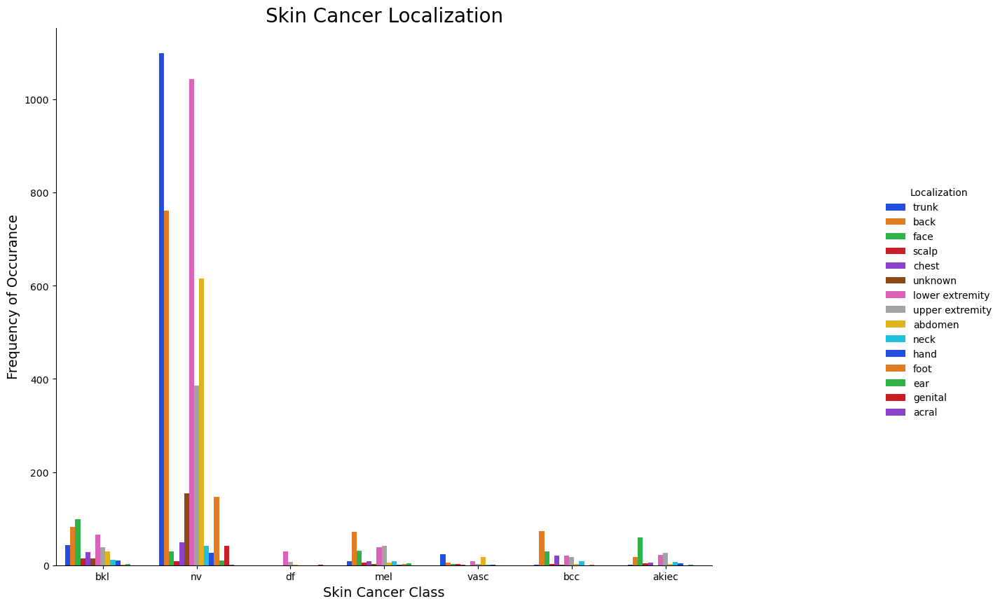

In [31]:
g = sns.catplot(x="dx", kind="count", hue="localization", palette='bright', data=skin_df)
g.fig.set_size_inches(16, 9)

g.ax.set_title('Skin Cancer Localization', fontsize=20)
g.set_xlabels('Skin Cancer Class', fontsize=14)
g.set_ylabels('Frequency of Occurance', fontsize=14)
g._legend.set_title('Localization')

In [32]:
def pltImg(images, labels, row_num, col_num):
    fig, axes = plt.subplots(row_num, col_num, figsize=(15, 8))
    axes = axes.ravel()  # Flatten axes array

    for i, image in enumerate(images):
        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(f"Class: {labels[i]}\nMean intensity: {np.mean(image):.1f}")

    plt.tight_layout()
    plt.show()


def pltHist(images, labels, row_num, col_num):
    fig, axes = plt.subplots(row_num, col_num, figsize=(15, 8))
    axes = axes.ravel()  # Flatten axes array
    colors = ["red", "green", "blue"]

    for i, image in enumerate(images):
        image_array = np.array(image)

        # Plotting all channels with colors
        for channel in range(3):
            hist, bin_edges = np.histogram(image_array[:, :, channel], bins=256, range=(0, 256))
            axes[i].plot(bin_edges[:-1], hist, color=colors[channel])

        axes[i].set_title(f"Class: {labels[i]}")

    plt.tight_layout()
    plt.show()

In [33]:
def randImg(df, label, seed, sample_size):
    # Filter dataframe for specific label/class
    df_class = df[df['dx'] == label]

    # Randomly sample images from this class
    random.seed(seed)
    sample_df = df_class.sample(n=sample_size)

    images = []
    labels = []
    for index, row in sample_df.iterrows():
        image_path = row['image_path']
        if os.path.exists(image_path):
            image = Image.open(image_path)
            images.append(image)
            labels.append(label)
        else:
            print(f"Image not found: {image_path}")

    return images, labels

Plot images from each class and their color distributions


--- Showcasing examples for class: bkl ---



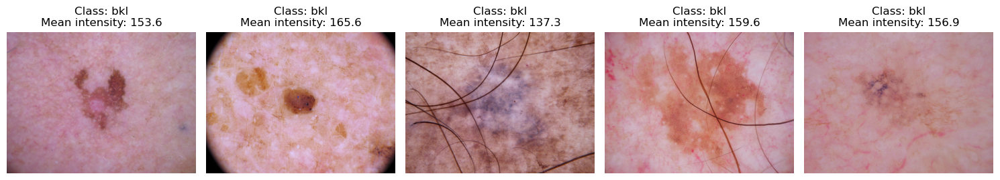

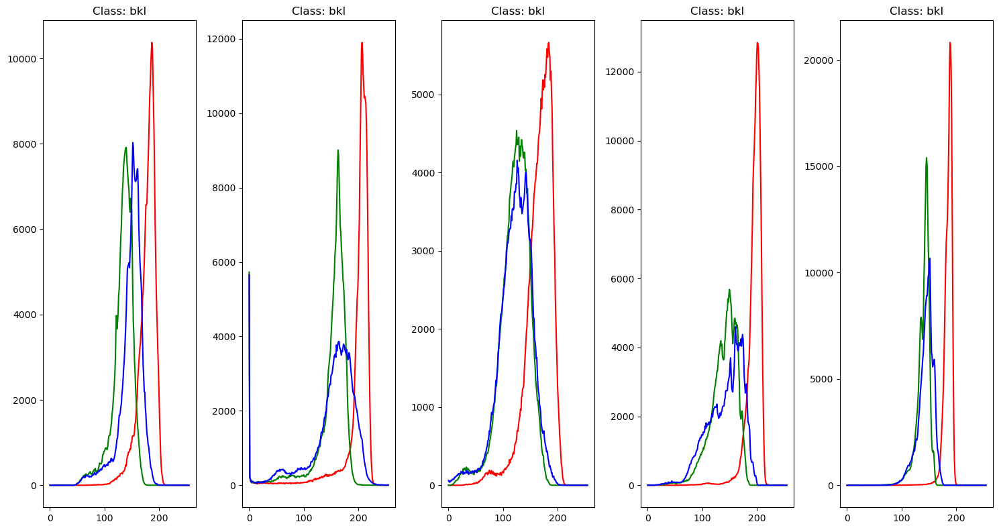


--- Showcasing examples for class: nv ---



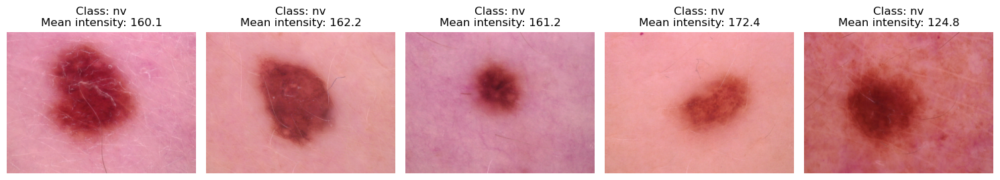

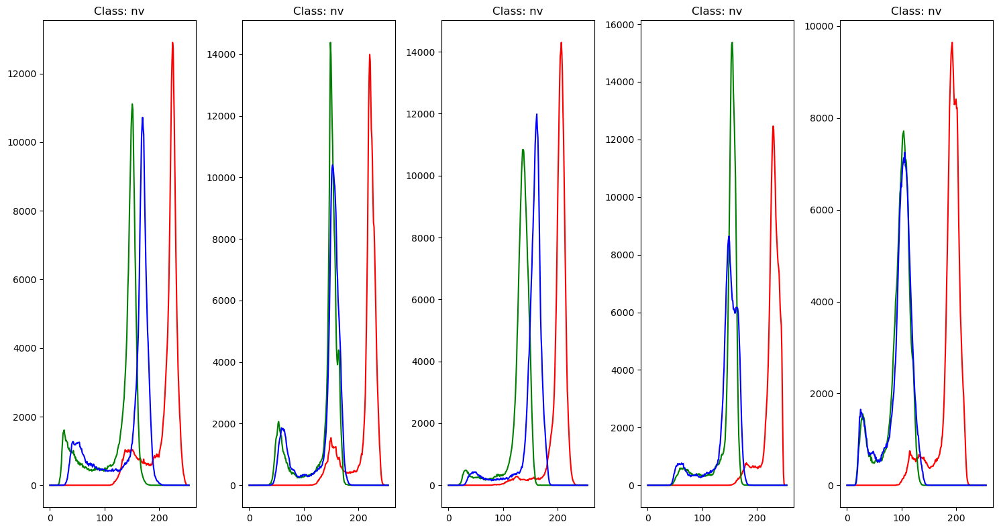


--- Showcasing examples for class: df ---



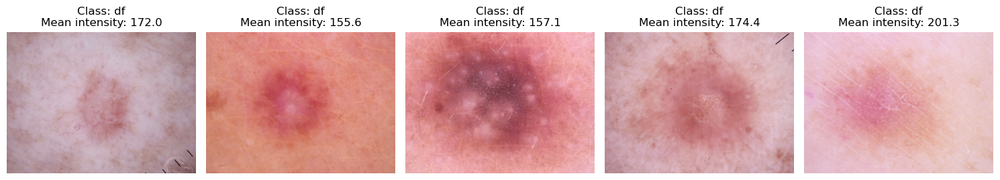

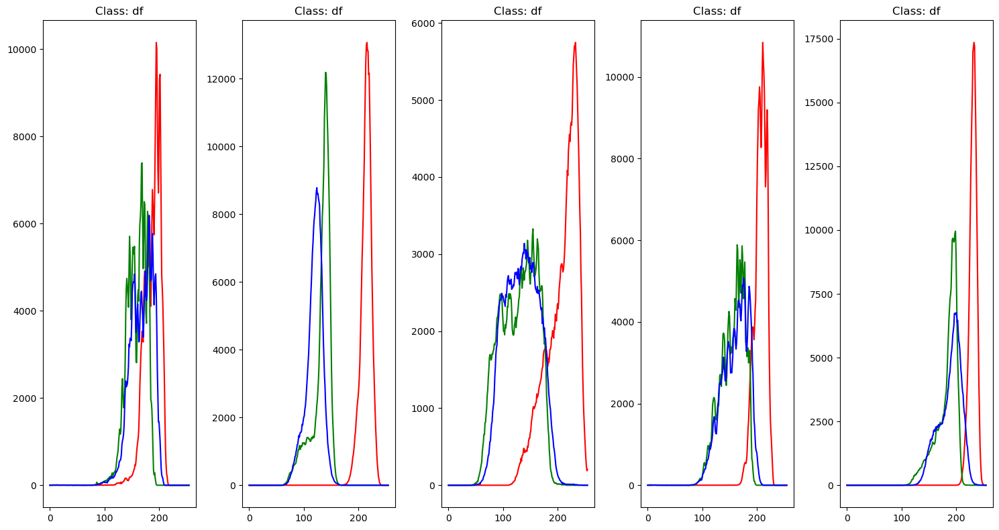


--- Showcasing examples for class: mel ---



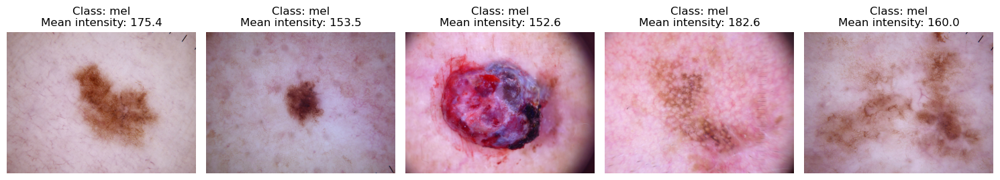

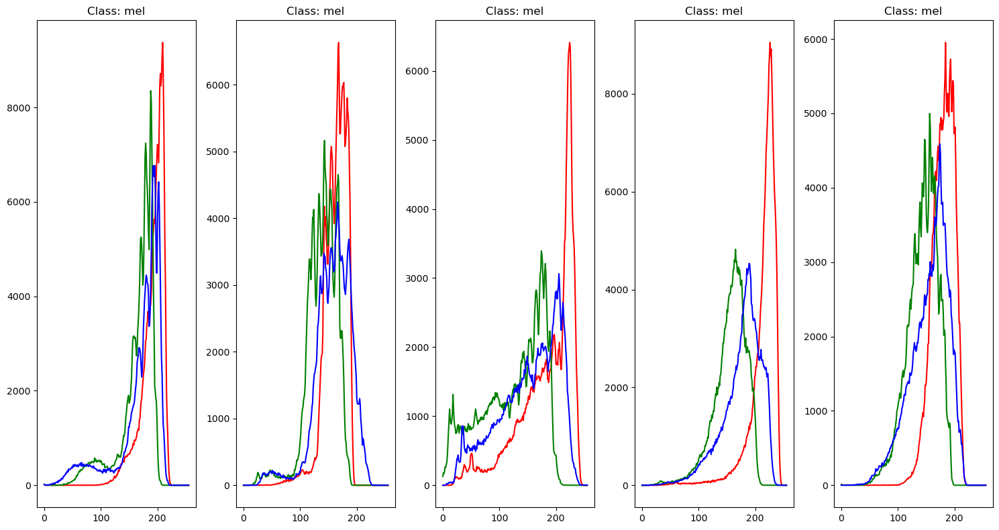


--- Showcasing examples for class: vasc ---



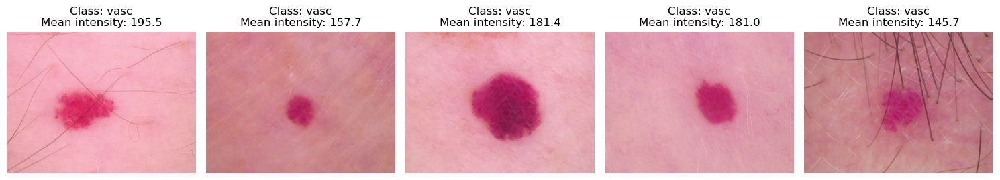

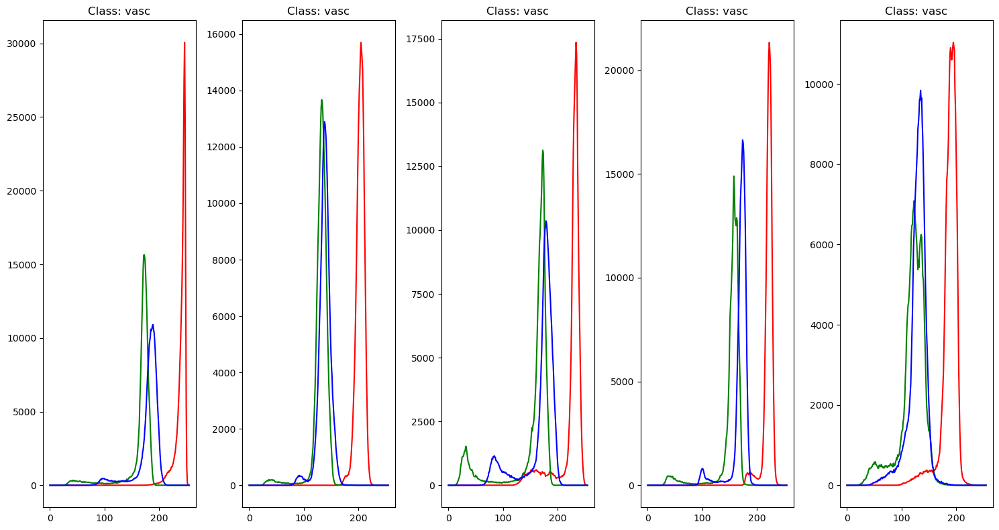


--- Showcasing examples for class: bcc ---



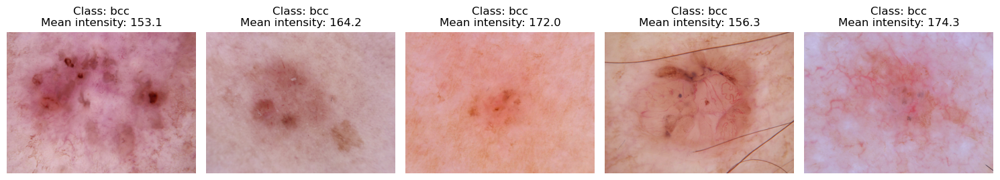

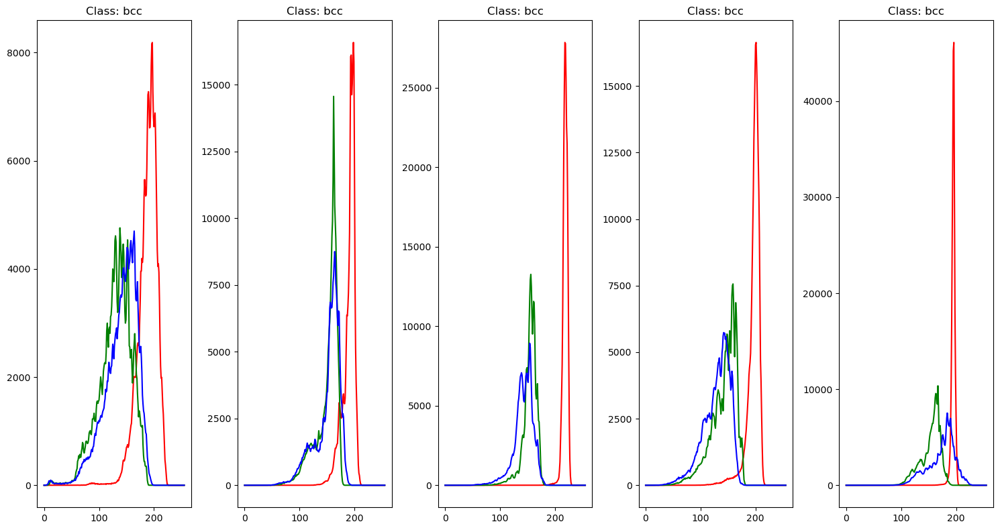


--- Showcasing examples for class: akiec ---



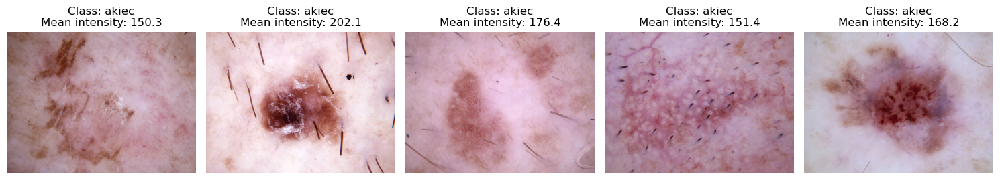

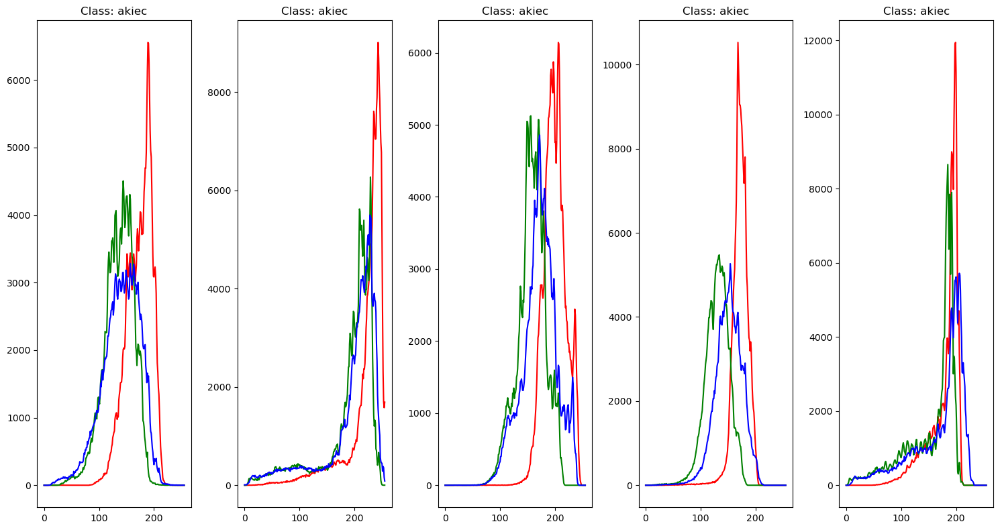

In [34]:
import random 
class_labels = ['bkl', 'nv', 'df', 'mel', 'vasc', 'bcc', 'akiec']

for class_label in class_labels:
    print(f"\n--- Showcasing examples for class: {class_label} ---\n")
    images, labels = randImg(df=skin_df, label=class_label, seed=42, sample_size=5)

    # For displaying images
    pltImg(images, labels, 1, 5)
    # pltImgEq(images, labels, 1, 5)
    # For displaying histograms
    pltHist(images, labels, 1, 5)

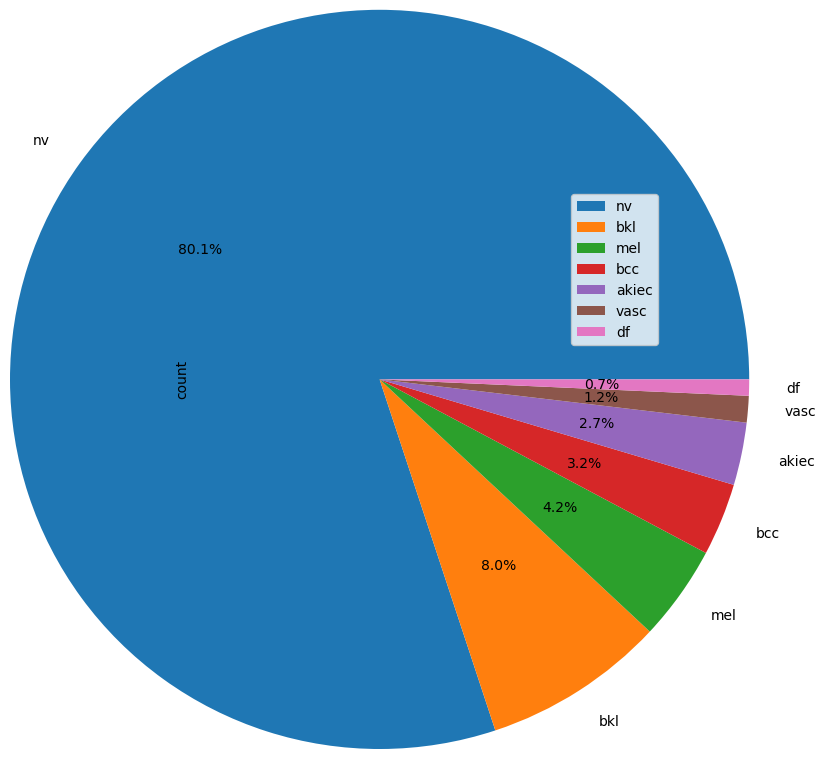

In [35]:
count = skin_df['dx'].value_counts()
ax = count.plot(kind="pie", autopct='%1.1f%%', legend=True,radius=2.5)
ax.legend(bbox_to_anchor=(1, 1.02), loc='upper left')
plt.show()

In [36]:
count

dx
nv       4415
bkl       440
mel       230
bcc       175
akiec     151
vasc       64
df         39
Name: count, dtype: int64

### Labels

**Melanocytic nevi (nv)**: Benign melanocyte neoplasms in various dermatoscopic variants.  
**[4415 images]**

**Melanoma (mel)**: Malignant melanocyte neoplasms, including invasive and in situ forms, excluding non-pigmented, subungual, ocular, or mucosal types.  
**[230 images]**

**Benign keratosis-like lesions (bkl)**: Includes seborrheic keratosis, solar lentigo, and lichen-planus like keratoses. These share biological similarities and are often grouped together histopathologically.  
**[440 images]**

**Basal cell carcinoma (bcc)**: Common, non-metastasizing epithelial skin cancer with various morphologic forms.  
**[175 images]**

**Actinic keratoses (akiec)**: Non-invasive variants of squamous cell carcinoma, including solar keratoses and Bowen’s disease, both linked to UV exposure.  
**[151 images]**

**Vascular lesions (vasc)**: Includes cherry angiomas, angiokeratomas, pyogenic granulomas, and hemorrhage.  
**[64 images]**

**Dermatofibrom (df)**: Benign skin lesion, often brown with a central fibrosis zone.  
**[39 images]**

---

**Total images**: 5514



--- Showing one sample for class: bkl ---



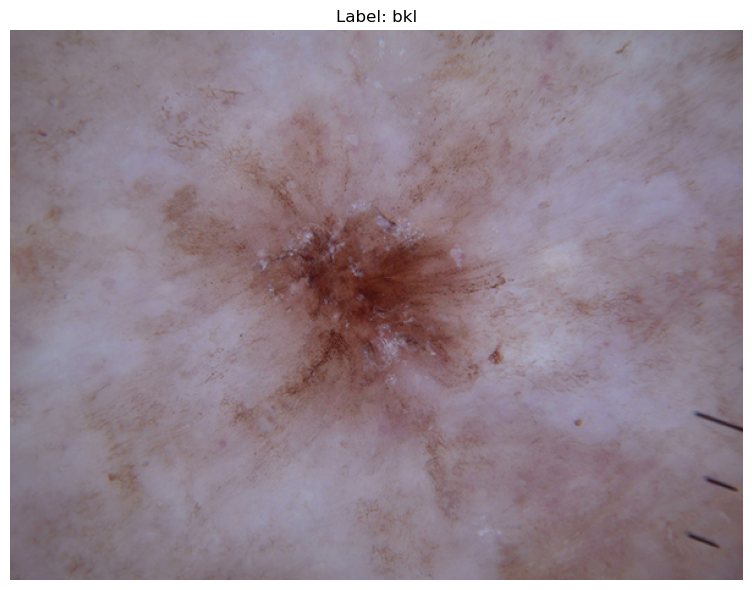

Press Enter to show the next image...

--- Showing one sample for class: nv ---



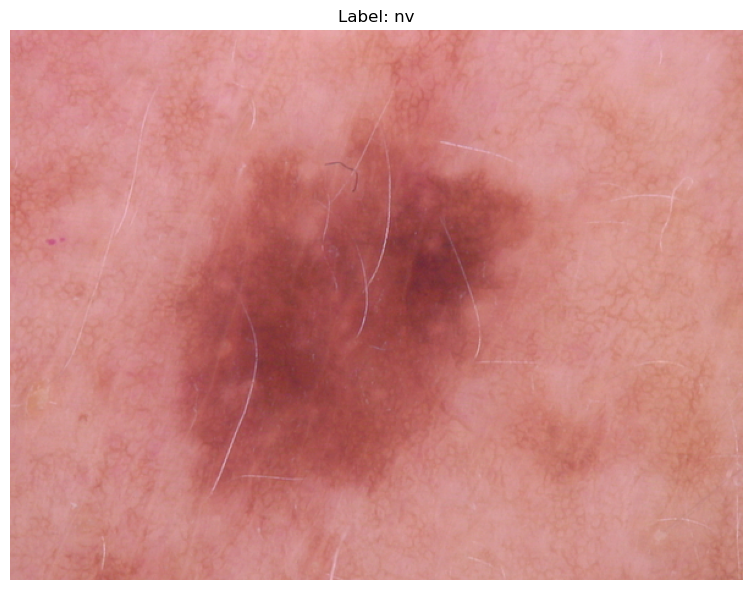

Press Enter to show the next image...

--- Showing one sample for class: df ---



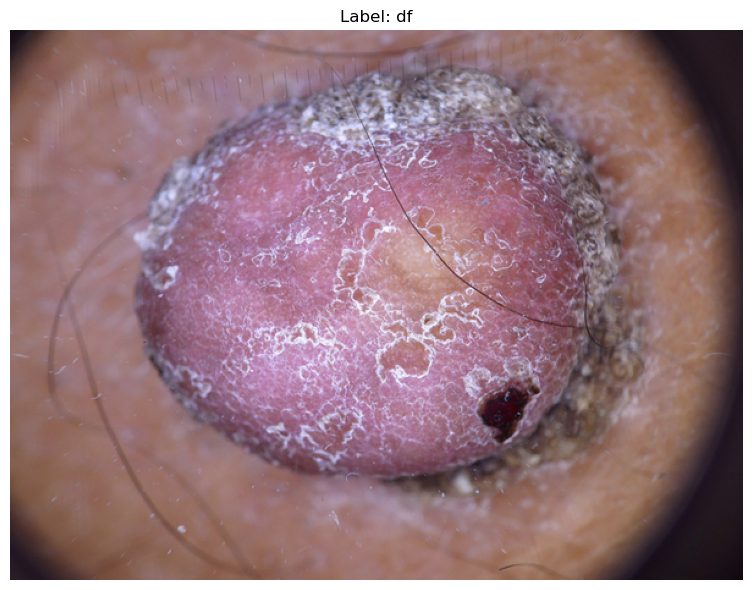

Press Enter to show the next image...

--- Showing one sample for class: mel ---



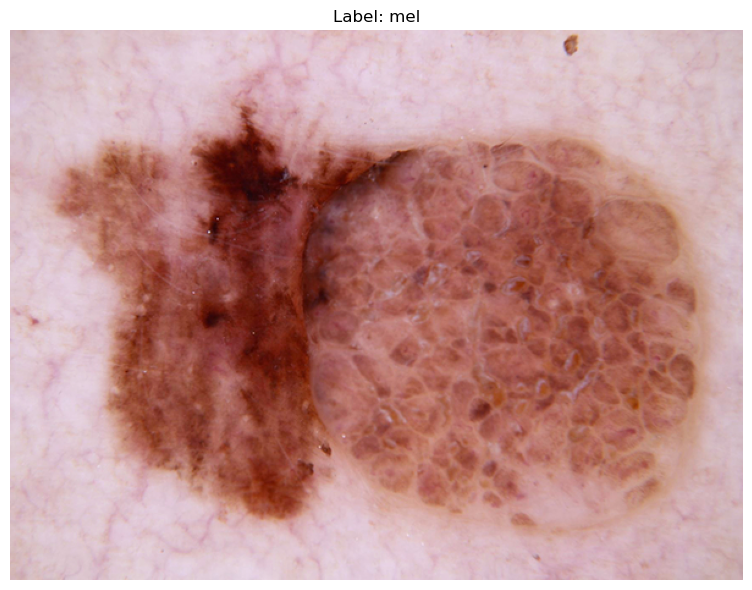

Press Enter to show the next image...

--- Showing one sample for class: vasc ---



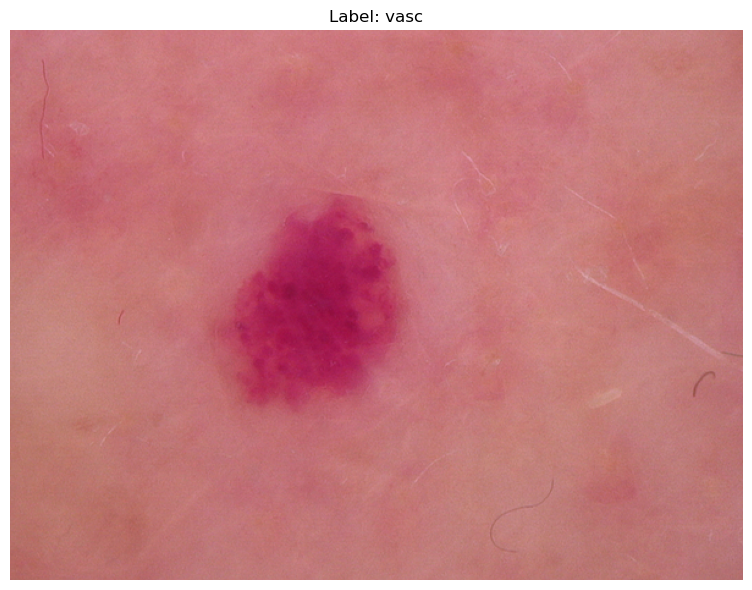

Press Enter to show the next image...

--- Showing one sample for class: bcc ---



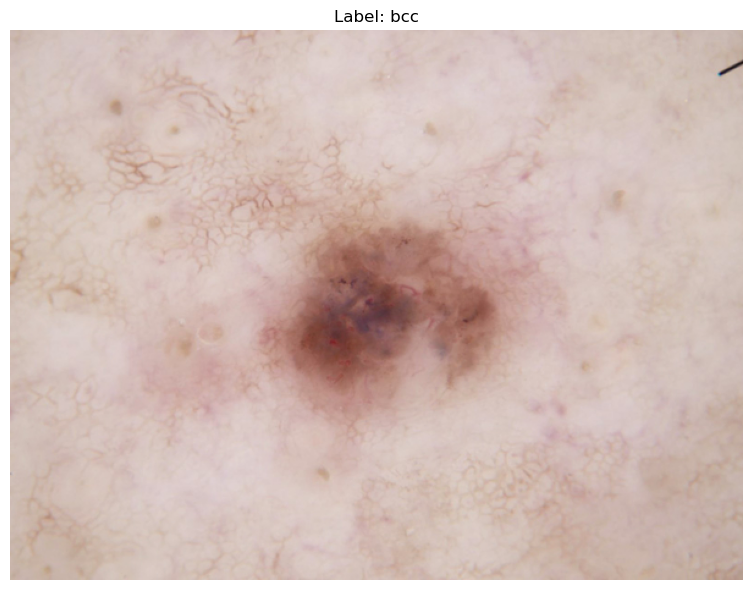

Press Enter to show the next image...

--- Showing one sample for class: akiec ---



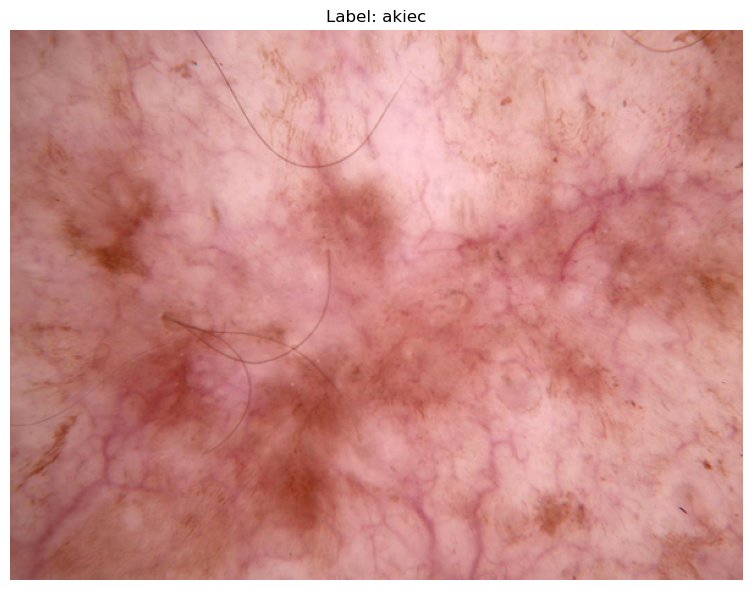

Press Enter to show the next image...


In [42]:
import random
import matplotlib.pyplot as plt

# List of class labels
class_labels = ['bkl', 'nv', 'df', 'mel', 'vasc', 'bcc', 'akiec']

# Function to plot a single image
def pltImg(images, labels):
    fig, ax = plt.subplots(figsize=(8, 6))  # Adjust the size for each image

    # Loop through the images and display the first one
    ax.imshow(images[0])  # Displaying only the first image from the list
    ax.set_title(f'Label: {labels[0]}')
    ax.axis('off')

    plt.tight_layout()
    plt.show()

# Loop through each class
for class_label in class_labels:
    print(f"\n--- Showing one sample for class: {class_label} ---\n")
    
    # Sample one random image from the specified class
    images, labels = randImg(df=skin_df, label=class_label, seed=42, sample_size=1)
    
    # Show the image with its label
    pltImg(images, labels)
    # Optionally, add a pause between images, e.g., using input() to wait for user to press Enter to proceed to the next one
    input("Press Enter to show the next image...")  # Pauses the loop until Enter is pressed

    
    